### ScanTemperature

Scanデータから温度を計算，ScanEnergyと同じように計算してみる

In [1]:
import MDUS
from MDUS import Analysis

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt

In [ ]:
result = pd.DataFrame()
orbits = []
datas = []
types = []
xs = []
ys = []
zs = []
rsss = []
nodata = []

for orbit in MDUS.orbit.index:
    # if not (orbit == 199 or orbit == 12):
    #     continue
    print("\033[31m orbit \033[0m", orbit)
    data = MDUS.ScanData()
    data.Input(orbit=orbit)

    if data.value is None or len(data.value[MDUS.EQTAB[-1]].values) == 0 or orbit in nodata:
        print("No data...")
        continue

    data.DataIntegration()
    data.MLAT()
    data.NTP()

    if orbit in MDUS.dip.index:
        dt = np.abs(data.value["MLAT"]).idxmin()
        ds = MDUS.dip.query('index == @orbit')['start'].values[0]
        de = MDUS.dip.query('index == @orbit')['end'].values[0]
        diptype = MDUS.diptype.query('index == @orbit')['type'].values[0]
    else:
        dt = np.abs(data.value["MLAT"]).idxmin()
        ds = dt - pd.Timedelta(minutes=5)
        de = dt + pd.Timedelta(minutes=5)
        diptype = "none"    

    xs.append(data.value.query('index == @dt')["X_MSO"].values[0])
    ys.append(data.value.query('index == @dt')["Y_MSO"].values[0])
    zs.append(data.value.query('index == @dt')["Z_MSO"].values[0])
    orbits.append(orbit)
    types.append(diptype)
    rsss.append(MDUS.Mercury.query('index == @orbit')['Rss'].values[0])

    datas.append(np.nanmean(data.value.query('@ds <= index <= @de')['T'].values))
    print("Done!")
    # break
result = result.dropna()
result['orbit'] = orbits
result['T'] = datas
result['X'] = xs
result['Y'] = ys
result['Z'] = zs
result['type'] = types
result['Rss'] = rsss
result = result.set_index('orbit')
result.to_pickle("./data/other/TemperatureAverage.pkl")

In [2]:
result = pd.read_pickle("./data/other/TemperatureAverage.pkl")
result_scan = pd.read_pickle("./data/other/ScanAverage.pkl")

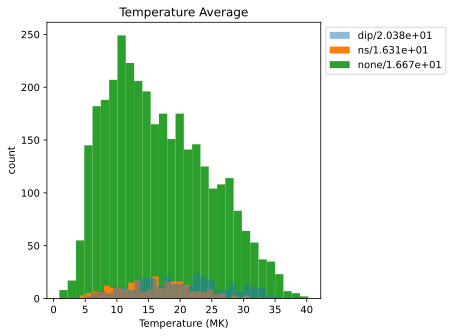

In [5]:
fig, ax = plt.subplots()
ax.set_title("Temperature Average")
Ttmp = result.query('type == "dip"')['T']
ax.hist(x=Ttmp,bins=30,zorder=2,label='dip/'+'{:.3e}'.format(np.mean(Ttmp)),alpha=0.5)
ax.set_ylabel('count')
ax.set_xlabel('Temperature')

Ttmp = result.query('type == "ns"')['T']
ax.hist(x=Ttmp,bins=30,zorder=1,label='ns/'+'{:.3e}'.format(np.mean(Ttmp)),alpha=1)
ax.set_ylabel('count')
ax.set_xlabel('Temperature')

Ttmp = result.query('type == "none"')['T']
ax.hist(x=Ttmp,bins=30,zorder=0,label='none/'+'{:.3e}'.format(np.mean(Ttmp)),alpha=1)

ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax.set_ylabel('count')
ax.set_xlabel('Temperature (MK)')
plt.tight_layout()
plt.savefig("./figure/flux/TemperatureAverage_all.png",dpi=400)

In [7]:
energys = []
for i in MDUS.EQTAB:
    if i >= 0.1:
        energys.append(i)
energys = np.array(energys)

for energy in energys:
    fig, ax = plt.subplots()
    fluxtmp = result_scan.query('type == "dip"')[energy]
    Ttmp = result.query('type == "dip"')['T']
    ax.scatter(x=Ttmp,y=fluxtmp,label='dip')

    fluxtmp = result_scan.query('type == "ns"')[energy]
    Ttmp = result.query('type == "ns"')['T']
    ax.scatter(x=Ttmp,y=fluxtmp,label='ns')

    ax.set_yscale('log')
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')
    ax.set_xlabel('Temperature (MK)')
    ax.set_ylabel('Flux')
    ax.set_title(str(energy) + ' keV/Q')
    plt.tight_layout()
    plt.savefig('./figure/Temperature/' + str(energy) + '_flux_T_hist_dip_ns.png',dpi=400)
    # break
    plt.close()

In [3]:
index_dip = result.query('type == "dip" & T >= 30').index
print(index_dip)
index_ns = result.query('type == "ns" & T >= 20').index
print(index_ns)

Index([  47,  196,  207,  546,  970, 1001, 1002, 1750, 1913, 1914, 2004, 2179,
       2205, 2719, 2720, 2722, 2758, 2968, 3239, 3241, 3245, 3246, 3493, 3503,
       3510, 3511, 3515, 3516, 3520, 3522, 3752, 3764, 3784, 3785, 3786, 4015,
       4016, 4018, 4022, 4026, 4029],
      dtype='int64', name='orbit')
Index([ 564,  881,  883,  886,  887,  888,  889,  893,  898,  907,  981, 1236,
       1390, 1418, 1419, 1428, 1430, 1506, 1510, 1511, 1534, 1665, 1675, 1676,
       1678, 1691, 1693, 1696, 1760, 1771, 1792, 1923, 1927, 1932, 1939, 1940,
       1941, 1942, 1944, 1947, 1950, 1951, 1953, 2028, 2040, 2041, 2185, 2190,
       2195, 2197, 2203, 2208, 2295, 2298, 2301, 2302, 2451, 2457, 2467, 2547,
       2572, 2579, 2725, 2814, 2826, 3249],
      dtype='int64', name='orbit')


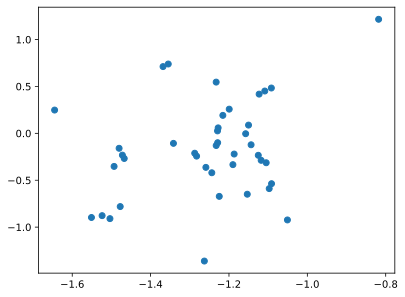

In [5]:
index_dip = result.query('type == "dip" & T >= 30').index
tmp = result.query('index in @index_dip')
fig, ax = plt.subplots()
ax.scatter(tmp['X'],tmp['Y'])

In [10]:
orbit = 199
data = MDUS.ScanData()
data.Input(orbit=orbit)
data.DataIntegration()
fig, ax = data.Plot()
ax2 = ax.twinx()
data.PlotMag(fig=fig, ax=ax2)

orbit = 883
data = MDUS.ScanData()
data.Input(orbit=orbit)
data.DataIntegration()
fig, ax = data.Plot()
ax2 = ax.twinx()
data.PlotMag(fig=fig, ax=ax2)

(<Figure size 900x300 with 3 Axes>,
 <Axes: title={'center': '2012/05/14 21:30:45 - 2012/05/14 23:30:52'}, xlabel='UTC', ylabel='Magnetic Field [nT]'>)

In [32]:
print(result.query('index == 52')['T'].values[0])
print(result.query('index == 199')['T'].values[0])
print(result.query('index == 200')['T'].values[0])
print(result.query('index == 201')['T'].values[0])

15.85588088361531
25.0392960354654
8.726410443126515
9.528713748458522
